## Use Case Summary: Diabetes-Related Data Analysis

### Objective:
The objective of this use case is to leverage diabetes-related data, comprising columns such as Pregnancies, Glucose, BloodPressure, SkinThickness, Insulin, BMI, DiabetesPedigreeFunction, Age, and Outcome, to develop actionable insights that can aid in the early detection and management of diabetes. The primary goal is to support healthcare providers and patients in making informed decisions for diabetes prevention and care.

### Challenge:
The main challenges in this use case include handling missing data, addressing data quality issues, and developing predictive models to identify individuals at risk of diabetes. Additionally, ensuring the privacy and security of patient data is crucial, given the sensitive nature of healthcare information.

### Business Benefit:
The analysis of diabetes-related data can offer significant benefits to healthcare providers, insurance companies, and individuals. By predicting diabetes risk and understanding key factors contributing to the disease, healthcare organizations can provide personalized care plans, reduce healthcare costs, and improve patient outcomes. Additionally, individuals can proactively manage their health to prevent or mitigate the effects of diabetes.

### Expected Outcome:
The expected outcome includes the development of predictive models that accurately identify individuals at risk of diabetes. These models can be used for early intervention, enabling healthcare professionals to offer timely guidance and support to at-risk patients. The analysis can also uncover insights into the relationships between various health parameters and diabetes, leading to more targeted prevention strategies.

### Business Understanding:
Understanding the impact of diabetes on healthcare costs and patient well-being is crucial. By identifying high-risk individuals and providing early intervention, healthcare providers can reduce hospitalization rates and long-term healthcare expenses. Insurance companies can better assess risk profiles, leading to more accurate pricing and policy decisions.

### Data Understanding:
Comprehensive data understanding involves exploring the dataset, assessing data quality, and identifying patterns and trends. This step will help identify outliers, missing values, and potential data anomalies, providing a foundation for subsequent data preparation and modeling.

### Data Dictionary:

##### Pregnancies: Number of pregnancies the patient has had
##### Glucose: Plasma glucose concentration
##### BloodPressure: Blood pressure measurement
##### SkinThickness: Thickness of skinfold
##### Insulin: Insulin level
##### BMI: Body Mass Index
##### DiabetesPedigreeFunction: A function that scores the likelihood of diabetes based on family history
##### Age: Age of the patient
##### Outcome: Binary outcome variable (0 for non-diabetic, 1 for diabetic)

### Data Preparation:
Data preparation involves cleaning, preprocessing, and transforming the data to make it suitable for analysis and modeling. This includes handling missing values, scaling features, encoding categorical variables, and splitting the dataset into training and testing sets. Data preparation is essential for building accurate predictive models.

In conclusion, leveraging diabetes-related data for analysis and predictive modeling can have a significant positive impact on healthcare outcomes and costs. By understanding the data, addressing challenges, and using it to develop actionable insights, this use case aims to improve diabetes prevention and management strategies.

In [209]:
# IMPORT LIBRARIES
import pandas as pd
import numpy as np

In [210]:
# LOAD DATASET
data = pd.read_csv("C:/Users/hp/OneDrive/Desktop/diabetes.csv")

In [211]:
# DISPLAY FIRST 5 ROWS
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


### Basic EDA and statistical analysis


In [212]:
# To check the overall information about the data

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [213]:
# Display Columns
data.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [214]:
# Check missing values

data.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [215]:
# No. of rows & columns
data.shape

(768, 9)

In [216]:
# Check Duplicate Values
data.duplicated().sum()

0

In [217]:
# To check the statistical Overview
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


In [218]:
# Assuming you have your DataFrame named 'data' already defined
# Create a deep copy of 'data'
new_data = data.copy(deep=True)

# Replace 0 values with NaN in specific columns
columns_to_replace = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
new_data[columns_to_replace] = new_data[columns_to_replace].replace(0, np.NaN)

# Show the count of NaNs
print(new_data.isnull().sum())


Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64


#### To fill these Nan values the data distribution needs to be understood


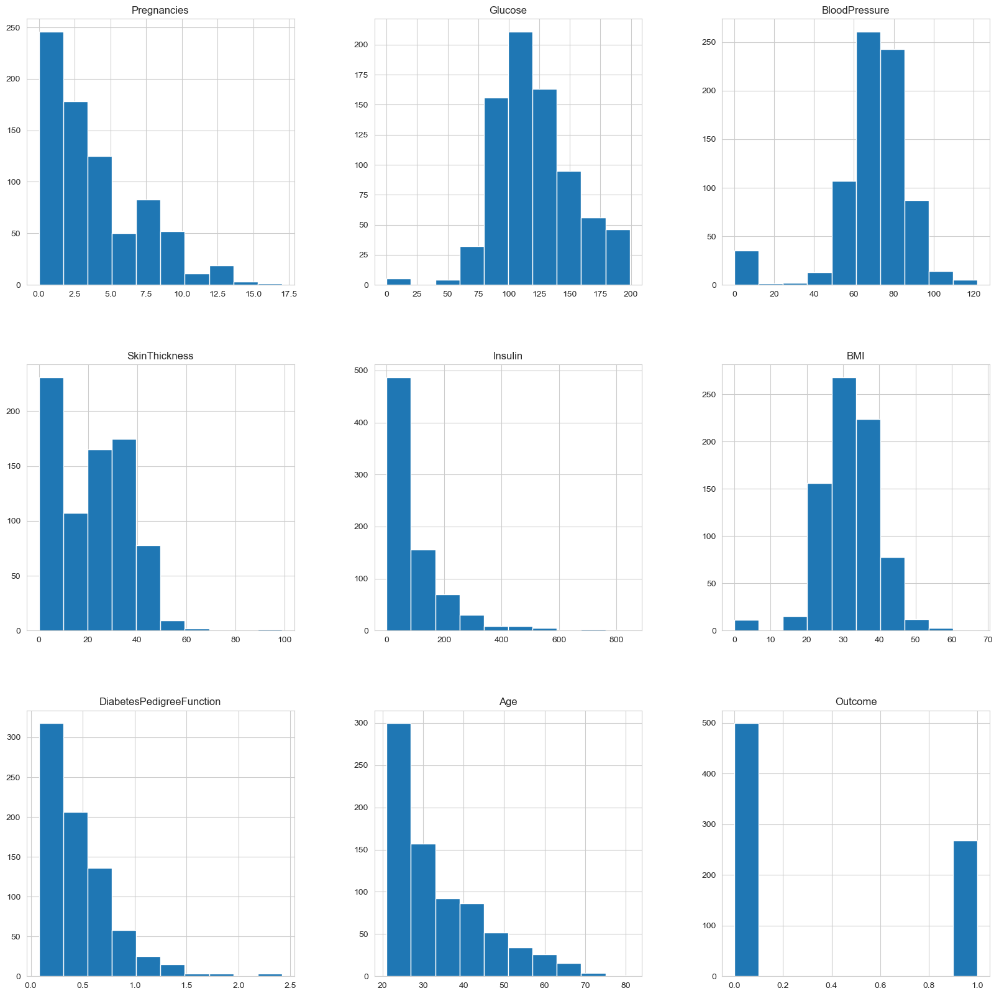

In [219]:
hist = data.hist(figsize = (20,20))

#### Aiming to impute nan values for the columns in accordance with their distribution


In [220]:
new_data['Glucose'].fillna(new_data['Glucose'].mean(), inplace = True)
new_data['BloodPressure'].fillna(new_data['BloodPressure'].mean(), inplace = True)
new_data['SkinThickness'].fillna(new_data['SkinThickness'].median(), inplace = True)
new_data['Insulin'].fillna(new_data['Insulin'].median(), inplace = True)
new_data['BMI'].fillna(new_data['BMI'].median(), inplace = True)

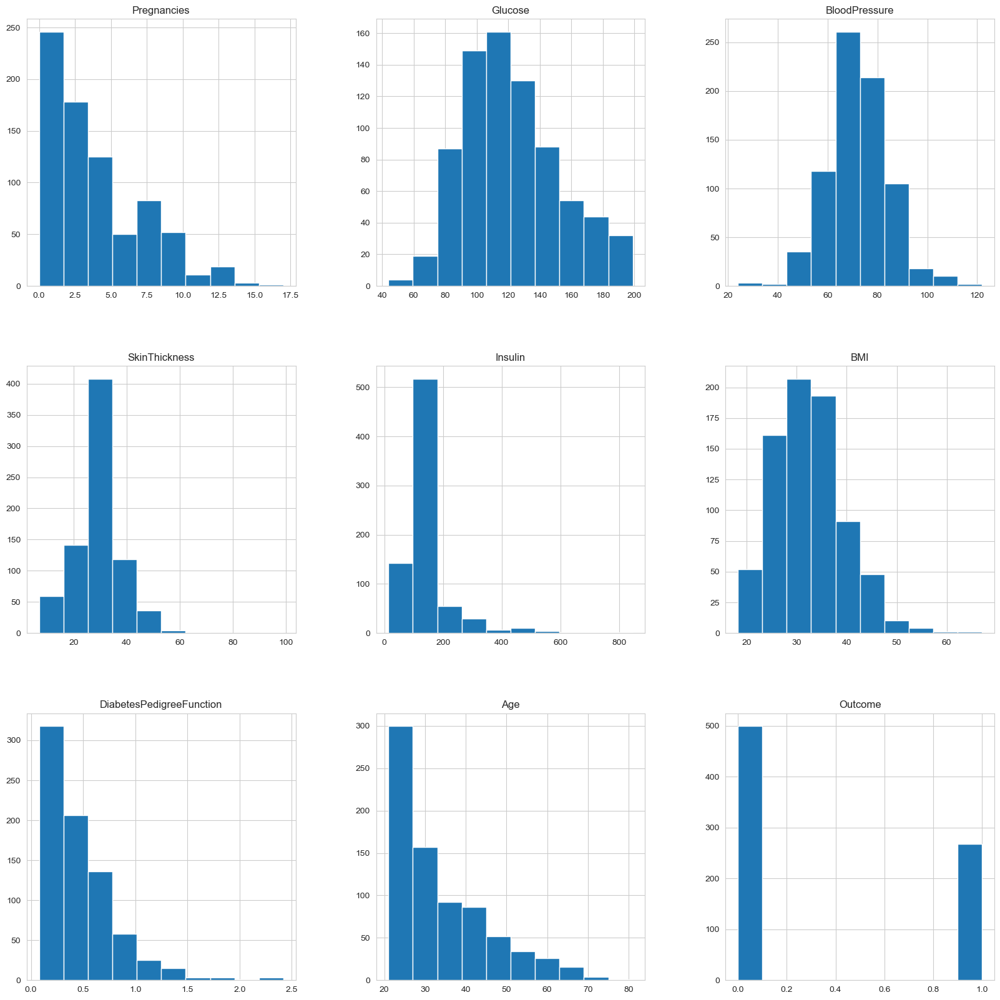

In [221]:
# Histogram after replacing NaN value with mean & median
new_hist = new_data.hist(figsize = (20,20))

<AxesSubplot:xlabel='DiabetesPedigreeFunction'>

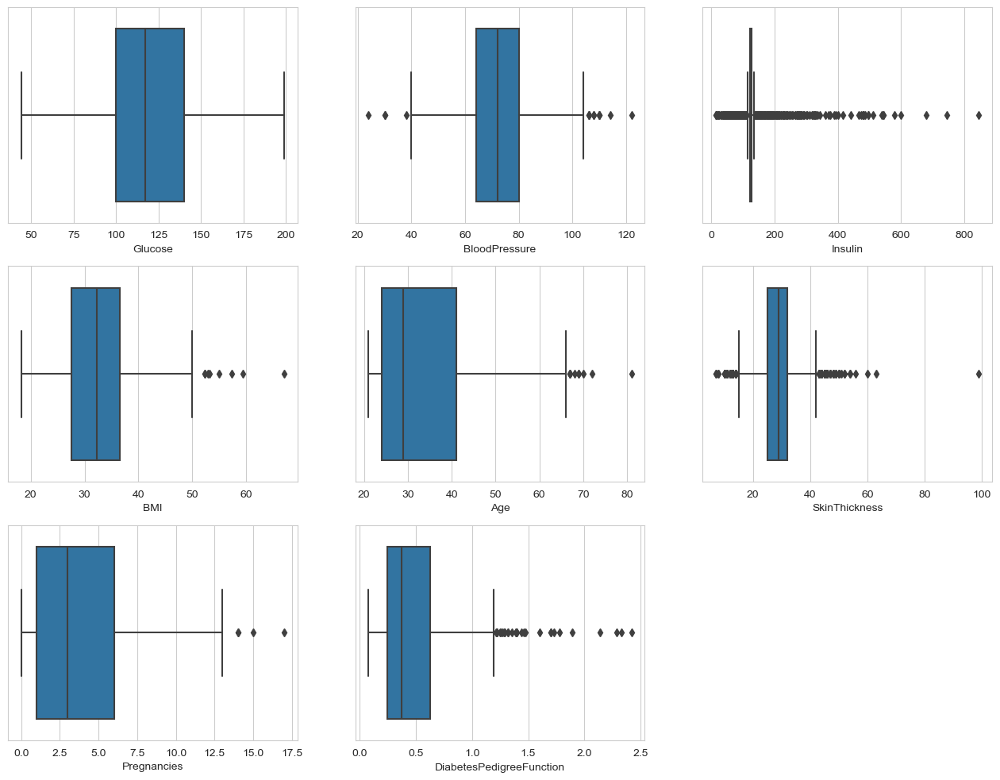

In [222]:
# Boxplot 
plt.figure(figsize=(16,12))
sns.set_style(style='whitegrid')
plt.subplot(3,3,1)
sns.boxplot(x='Glucose',data=new_data)
plt.subplot(3,3,2)
sns.boxplot(x='BloodPressure',data=new_data)
plt.subplot(3,3,3)
sns.boxplot(x='Insulin',data=new_data)
plt.subplot(3,3,4)
sns.boxplot(x='BMI',data=new_data)
plt.subplot(3,3,5)
sns.boxplot(x='Age',data=new_data)
plt.subplot(3,3,6)
sns.boxplot(x='SkinThickness',data=new_data)
plt.subplot(3,3,7)
sns.boxplot(x='Pregnancies',data=new_data)
plt.subplot(3,3,8)
sns.boxplot(x='DiabetesPedigreeFunction',data=new_data)

## Compare pair plots and heatmaps before and after data cleaning

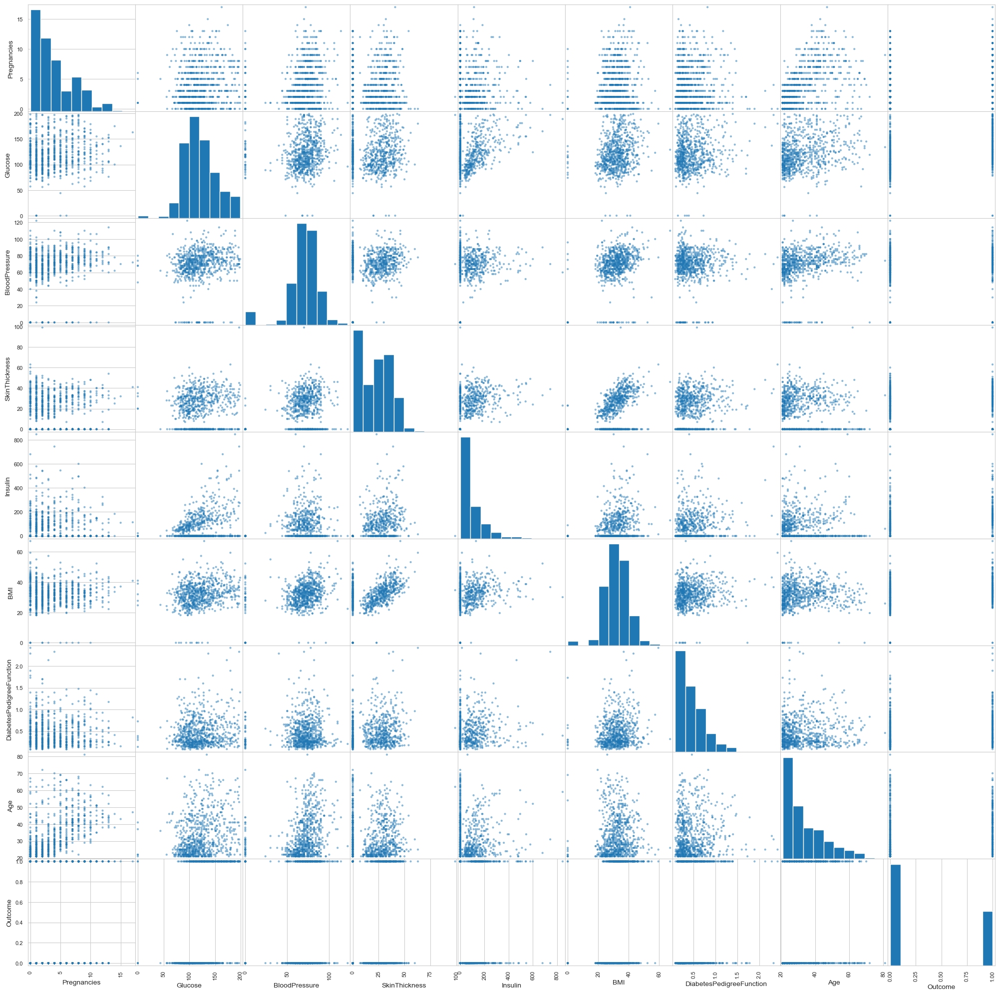

In [223]:
# Scatter matrix of uncleaned data
import seaborn as sns
from pandas.plotting import scatter_matrix
p=scatter_matrix(data,figsize=(25, 25))


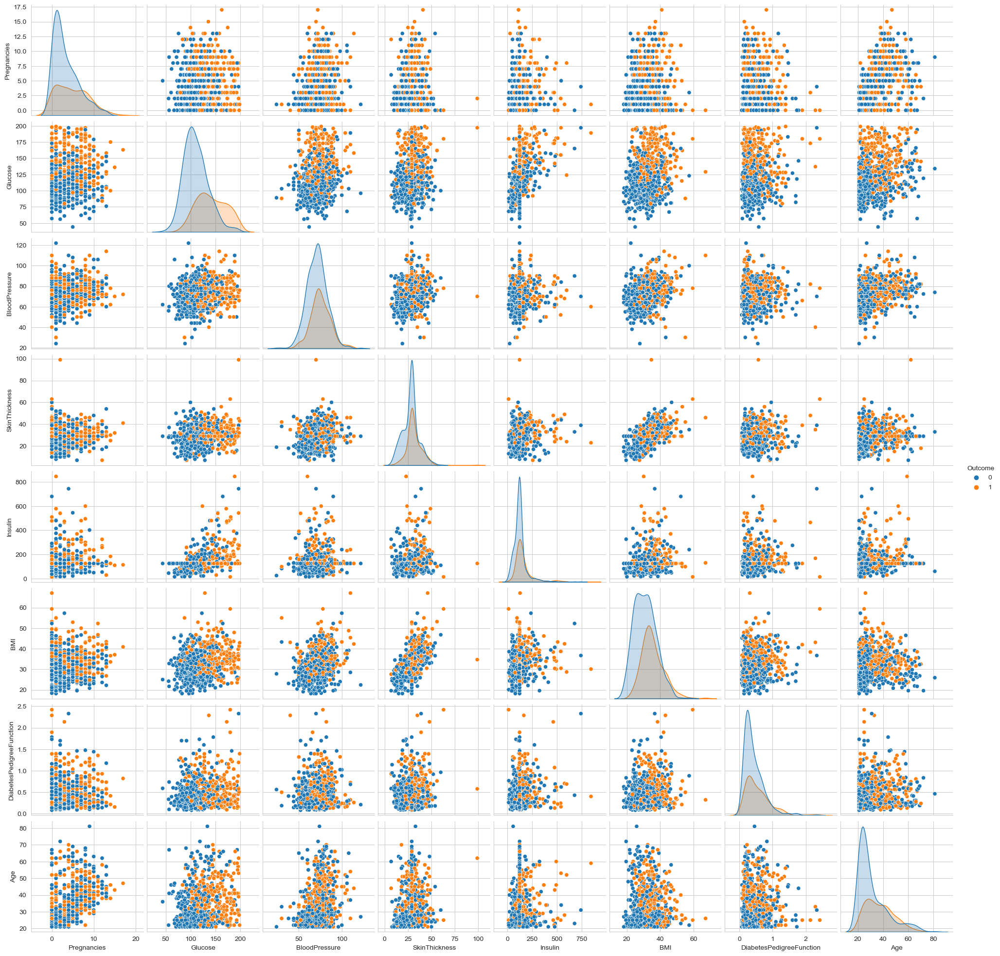

In [224]:
# Pair plot for clean data

new_pair = sns.pairplot(new_data, hue = 'Outcome')

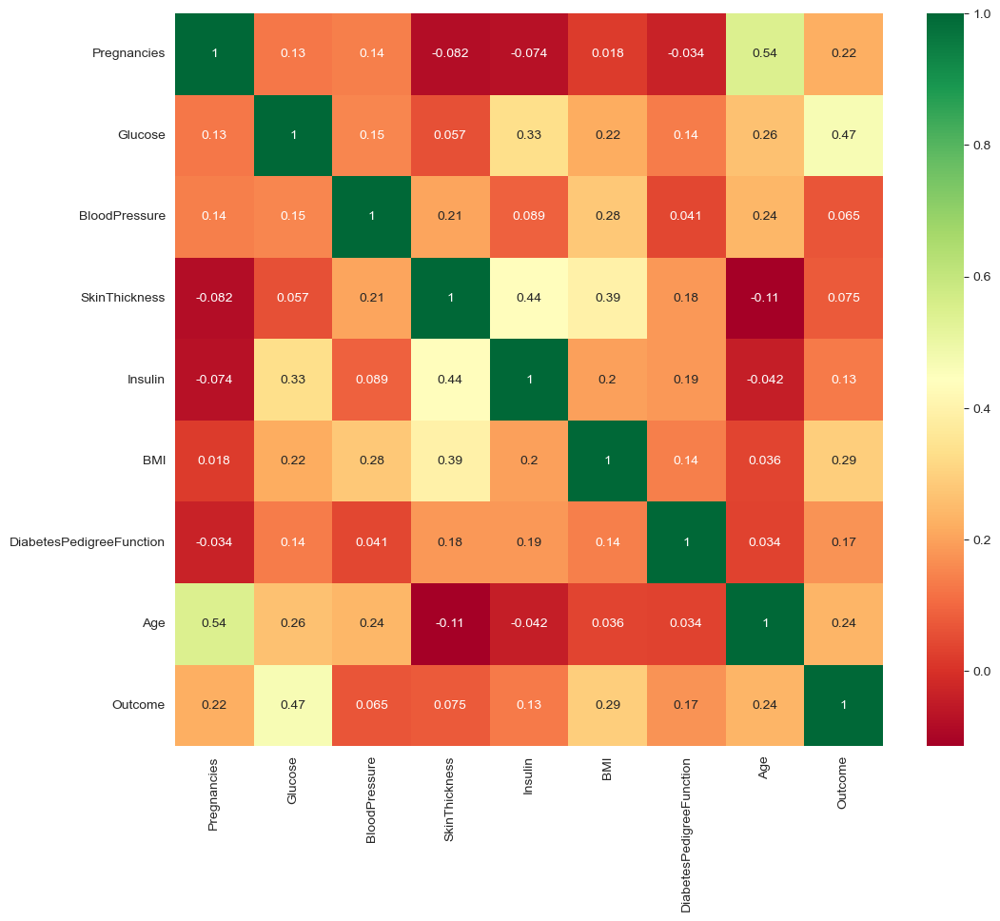

In [225]:
#Heatmap for unclean data
import matplotlib.pyplot as plt
plt.figure(figsize=(12,10))  
heat =sns.heatmap(data.corr(), annot=True,cmap ='RdYlGn')  

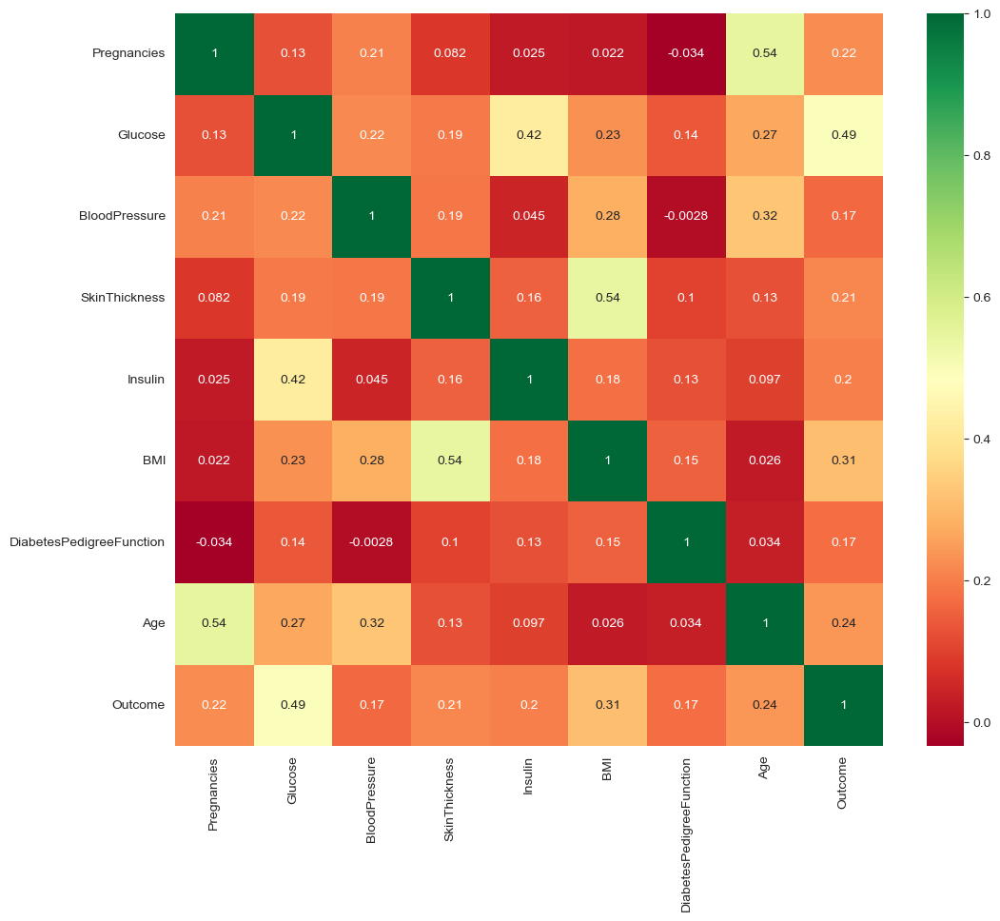

In [226]:
# heatmap for clean data
plt.figure(figsize=(12,10))  # on this line I just set the size of figure to 12 by 10.
new_heat=sns.heatmap(new_data.corr(), annot=True,cmap ='RdYlGn')  # seaborn has very simple solution for heatmap

### Checking the distribution of the target column

In [227]:
new_data['Outcome'].value_counts()

0    500
1    268
Name: Outcome, dtype: int64

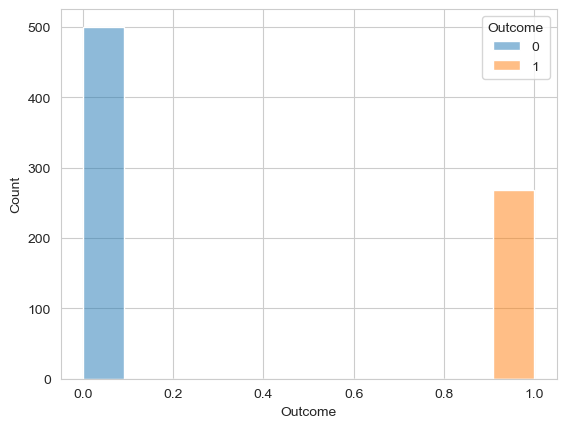

In [228]:
sns.histplot(x=new_data['Outcome'], hue= new_data['Outcome'])
plt.show()

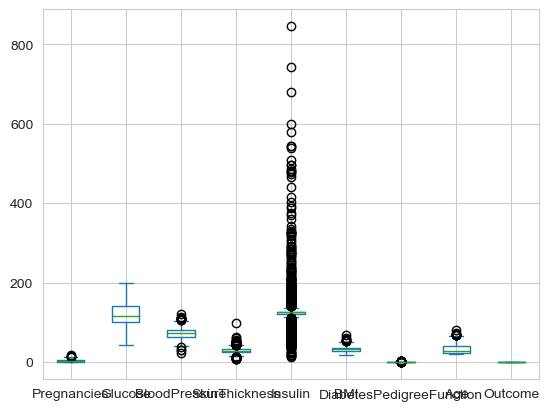

In [229]:
new_data.plot(kind="box")
plt.show()

In [230]:
# define function to identify and remove outliers using percentile method
def remove_outliers(new_data, col, threshold=1.5):
    q25, q75 = np.percentile(new_data[col], [25, 75])
    iqr = q75 - q25
    lower_bound = q25 - (threshold * iqr)
    upper_bound = q75 + (threshold * iqr)
    outliers = new_data[(new_data[col] < lower_bound) | (new_data[col] > upper_bound)]
    new_data_clean = new_data.drop(outliers.index)
    return new_data_clean

# call function for each column in DataFrame
for col in new_data.columns:
    new_data_clean = remove_outliers(new_data, col)
    print(f"{col}: {len(new_data)-len(new_data_clean)} outliers removed")

Pregnancies: 4 outliers removed
Glucose: 0 outliers removed
BloodPressure: 14 outliers removed
SkinThickness: 87 outliers removed
Insulin: 346 outliers removed
BMI: 8 outliers removed
DiabetesPedigreeFunction: 29 outliers removed
Age: 9 outliers removed
Outcome: 0 outliers removed


In [231]:
from ydata_profiling import ProfileReport
profile = ProfileReport(new_data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:xlabel='DiabetesPedigreeFunction'>

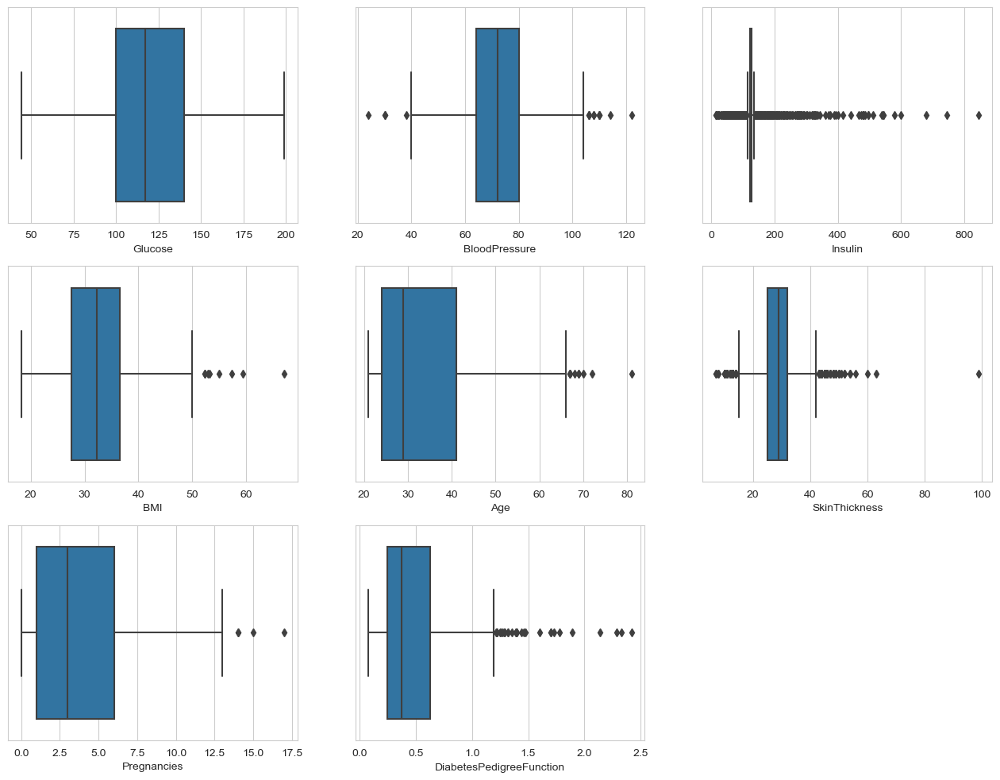

In [232]:
# Boxplot after clean the data
plt.figure(figsize=(16,12))
sns.set_style(style='whitegrid')
plt.subplot(3,3,1)
sns.boxplot(x='Glucose',data=new_data)
plt.subplot(3,3,2)
sns.boxplot(x='BloodPressure',data=new_data)
plt.subplot(3,3,3)
sns.boxplot(x='Insulin',data=new_data)
plt.subplot(3,3,4)
sns.boxplot(x='BMI',data=new_data)
plt.subplot(3,3,5)
sns.boxplot(x='Age',data=new_data)
plt.subplot(3,3,6)
sns.boxplot(x='SkinThickness',data=new_data)
plt.subplot(3,3,7)
sns.boxplot(x='Pregnancies',data=new_data)
plt.subplot(3,3,8)
sns.boxplot(x='DiabetesPedigreeFunction',data=new_data)

In [233]:
new_data.corr()#find co-relation

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.127911,0.208522,0.081770,0.025047,0.021559,-0.033523,0.544341,0.221898
Glucose,0.127911,1.000000,0.218367,0.192686,0.419064,0.231128,0.137060,0.266534,0.492928
BloodPressure,0.208522,0.218367,1.000000,0.191853,0.045087,0.281199,-0.002763,0.324595,0.166074
SkinThickness,0.081770,0.192686,0.191853,1.000000,0.155610,0.543205,0.102188,0.126107,0.214873
Insulin,0.025047,0.419064,0.045087,0.155610,1.000000,0.180241,0.126503,0.097101,0.203790
BMI,0.021559,0.231128,0.281199,0.543205,0.180241,1.000000,0.153438,0.025597,0.312038
DiabetesPedigreeFunction,-0.033523,0.137060,-0.002763,0.102188,0.126503,0.153438,1.000000,0.033561,0.173844
Age,0.544341,0.266534,0.324595,0.126107,0.097101,0.025597,0.033561,1.000000,0.238356
Outcome,0.221898,0.492928,0.166074,0.214873,0.203790,0.312038,0.173844,0.238356,1.000000


# Model Evaluation

In [234]:
# Target variable
X = new_data.drop(['Outcome'], axis = 1)
y = new_data.loc[:,"Outcome"].values

In [235]:
# independent features 
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.0,125.0,33.6,0.627,50
1,1,85.0,66.0,29.0,125.0,26.6,0.351,31
2,8,183.0,64.0,29.0,125.0,23.3,0.672,32
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33


In [236]:
# dependent features 
y

array([1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1,

In [237]:
#test_train split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.33, random_state=65)

In [238]:
X_train.shape,y_train.shape

((514, 8), (514,))

In [239]:
X_test.shape,y_test.shape

((254, 8), (254,))

In [240]:
# Normalize the training set
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_norm = scaler.fit_transform(X_train)

# Normalize the testing set using the same scaler object
X_train_norm = scaler.transform(X_test)
X_train_norm

array([[-5.57796103e-01,  1.30697408e-01, -2.12347207e+00, ...,
         2.70174893e-01, -9.00799244e-01, -9.58243316e-01],
       [-2.65833581e-01,  1.29944038e+00, -1.71770394e-01, ...,
        -1.23025336e-01, -6.24154065e-01, -4.44291597e-01],
       [-8.49758626e-01, -4.17972767e-02,  1.53513219e-01, ...,
        -6.70697082e-01, -5.30936668e-01, -1.04390194e+00],
       ...,
       [ 1.48594155e+00,  1.00725463e+00,  4.78796831e-01, ...,
        -2.21325393e-01, -9.36883397e-01,  1.01190494e+00],
       [ 1.48594155e+00,  8.37077974e-04, -1.71770394e-01, ...,
         8.76176440e-02, -3.05410708e-01,  5.83611842e-01],
       [-5.57796103e-01, -1.07051064e+00, -9.84979425e-01, ...,
        -1.26049743e+00, -8.55694051e-01, -7.01267456e-01]])

## Logistic Regression

In [241]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score

In [242]:
model = LogisticRegression(random_state=42)
model.fit(X_train,y_train)
pred_log = model.predict(X_test)

C:\Users\hp\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [243]:
accuracy = accuracy_score(y_test, pred_log)
print("Accuracy:", accuracy)

Mean = mean_squared_error(y_test,pred_log)
print("Mean Squared Error:", Mean)

R2 = r2_score(y_test,pred_log)
print("R2 score:", R2)

# calculating the training and testing accuracies
print("Training accuracy :", model.score(X_train, y_train))
print("Testing accuracy :", model.score(X_test, y_test))

print("Classification Report:")
print(classification_report(y_test, pred_log))

print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_log))

Accuracy: 0.7677165354330708
Mean Squared Error: 0.23228346456692914
R2 score: -0.03145433271388254
Training accuracy : 0.7723735408560312
Testing accuracy : 0.7677165354330708
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.91      0.84       167
           1       0.74      0.49      0.59        87

    accuracy                           0.77       254
   macro avg       0.76      0.70      0.72       254
weighted avg       0.76      0.77      0.75       254

Confusion Matrix:
[[152  15]
 [ 44  43]]


## Decision Tree Classifier

In [244]:
from sklearn.tree import DecisionTreeClassifier

dc = DecisionTreeClassifier(random_state=42)
dc.fit(X_train, y_train)
pred_dc = dc.predict(X_test)

In [245]:
accuracy = accuracy_score(y_test, pred_dc)
print("Accuracy:", accuracy)

Mean = mean_squared_error(y_test,pred_dc)
print("Mean Squared Error:", Mean)

R2 = r2_score(y_test,pred_dc)
print("R2 score:", R2)

# calculating the training and testing accuracies
print("Training accuracy :", dc.score(X_train, y_train))
print("Testing accuracy :", dc.score(X_test, y_test))

print("Classification Report:")
print(classification_report(y_test, pred_dc))

print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_dc))

Accuracy: 0.7086614173228346
Mean Squared Error: 0.29133858267716534
R2 score: -0.293688485098768
Training accuracy : 1.0
Testing accuracy : 0.7086614173228346
Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.76      0.77       167
           1       0.57      0.61      0.59        87

    accuracy                           0.71       254
   macro avg       0.68      0.68      0.68       254
weighted avg       0.71      0.71      0.71       254

Confusion Matrix:
[[127  40]
 [ 34  53]]


## RandomForestClassifier

In [246]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)
pred_rf = rf.predict(X_test)

In [247]:
accuracy = accuracy_score(y_test, pred_rf)
print("Accuracy:", accuracy)

Mean = mean_squared_error(y_test,pred_rf)
print("Mean Squared Error:", Mean)

R2 = r2_score(y_test,pred_rf)
print("R2 score:", R2)

# calculating the training and testing accuracies
print("Training accuracy :", rf.score(X_train, y_train))
print("Testing accuracy :", rf.score(X_test, y_test))

print("Classification Report:")
print(classification_report(y_test, pred_rf))

print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_rf))

Accuracy: 0.7519685039370079
Mean Squared Error: 0.24803149606299213
R2 score: -0.10138344001651878
Training accuracy : 0.9902723735408561
Testing accuracy : 0.7519685039370079
Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.86      0.82       167
           1       0.67      0.55      0.60        87

    accuracy                           0.75       254
   macro avg       0.73      0.70      0.71       254
weighted avg       0.74      0.75      0.75       254

Confusion Matrix:
[[143  24]
 [ 39  48]]


### KNeighborsClassifier

In [248]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors =3)

knn.fit(X_train,y_train)
pred_knn= knn.predict(X_test)

C:\Users\hp\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [249]:
accuracy = accuracy_score(y_test, pred_knn)
print("Accuracy:", accuracy)

Mean = mean_squared_error(y_test,pred_knn)
print("Mean Squared Error:", Mean)

R2 = r2_score(y_test,pred_knn)
print("R2 score:", R2)

# calculating the training and testing accuracies
print("Training accuracy :", knn.score(X_train, y_train))
print("Testing accuracy :", knn.score(X_test, y_test))

print("Classification Report:")
print(classification_report(y_test, pred_knn))

print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_knn))

Accuracy: 0.6771653543307087
Mean Squared Error: 0.3228346456692913
R2 score: -0.43354669970404025
Training accuracy : 0.8599221789883269
Testing accuracy : 0.6771653543307087
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.76      0.76       167
           1       0.53      0.52      0.52        87

    accuracy                           0.68       254
   macro avg       0.64      0.64      0.64       254
weighted avg       0.68      0.68      0.68       254

Confusion Matrix:
[[127  40]
 [ 42  45]]


C:\Users\hp\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\hp\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to 

## Support Vector Machine

In [250]:
from sklearn.svm import SVC
svc= SVC()

svc.fit(X_train, y_train)

svm_pred = svc.predict(X_test)

In [251]:
accuracy = accuracy_score(y_test, svm_pred )
print("Accuracy:", accuracy)

Mean = mean_squared_error(y_test,svm_pred)
print("Mean Squared Error:", Mean)

R2 = r2_score(y_test,svm_pred)
print("R2 score:", R2)

# calculating the training and testing accuracies
print("Training accuracy :", svc.score(X_train, y_train))
print("Testing accuracy :", svc.score(X_test, y_test))

print("Classification Report:")
print(classification_report(y_test, svm_pred ))

print("Confusion Matrix:")
print(confusion_matrix(y_test, svm_pred))

Accuracy: 0.7677165354330708
Mean Squared Error: 0.23228346456692914
R2 score: -0.03145433271388254
Training accuracy : 0.7704280155642024
Testing accuracy : 0.7677165354330708
Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.94      0.84       167
           1       0.79      0.44      0.56        87

    accuracy                           0.77       254
   macro avg       0.78      0.69      0.70       254
weighted avg       0.77      0.77      0.75       254

Confusion Matrix:
[[157  10]
 [ 49  38]]


## XGBClassifier

In [252]:
from xgboost import XGBClassifier

xgboost = XGBClassifier()
xgboost.fit(X_train,y_train)

xg_pred = xgboost.predict(X_test)

In [253]:
accuracy = accuracy_score(y_test, xg_pred )
print("Accuracy:", accuracy)

Mean = mean_squared_error(y_test,xg_pred)
print("Mean Squared Error:", Mean)

R2 = r2_score(y_test,xg_pred)
print("R2 score:", R2)

# calculating the training and testing accuracies
print("Training accuracy :", xgboost.score(X_train, y_train))
print("Testing accuracy :", xgboost.score(X_test, y_test))

print("Classification Report:")
print(classification_report(y_test, xg_pred ))

print("Confusion Matrix:")
print(confusion_matrix(y_test, xg_pred))

Accuracy: 0.7204724409448819
Mean Squared Error: 0.2795275590551181
R2 score: -0.24124165462179104
Training accuracy : 1.0
Testing accuracy : 0.7204724409448819
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.80      0.79       167
           1       0.60      0.56      0.58        87

    accuracy                           0.72       254
   macro avg       0.69      0.68      0.69       254
weighted avg       0.72      0.72      0.72       254

Confusion Matrix:
[[134  33]
 [ 38  49]]


## Making the model with 6 input nodes for 6 features


In [254]:
from keras.models import Sequential
from keras.layers import Dense, Dropout 

In [255]:
model_ANN = Sequential()

model_ANN.add(Dense(6, activation = 'relu'))
model_ANN.add(Dropout(0.5))

model_ANN.add(Dense(6, activation = 'relu'))
model_ANN.add(Dropout(0.5))

## Binary classification
model_ANN.add(Dense(1, activation = 'sigmoid'))

model_ANN.compile(loss = 'binary_crossentropy', optimizer = 'adam')

In [256]:
from keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=25, restore_best_weights=True)

In [257]:
history = model_ANN.fit(x=X_train, y=y_train, batch_size=128, epochs=600, validation_data=(X_test, y_test), callbacks=[early_stop])

Epoch 1/600
5/5 [==============================] - 3s 83ms/step - loss: 73.6519 - val_loss: 52.5010
Epoch 2/600
5/5 [==============================] - 0s 24ms/step - loss: 63.2535 - val_loss: 49.3769
Epoch 3/600
5/5 [==============================] - 0s 21ms/step - loss: 59.1024 - val_loss: 46.5909
Epoch 4/600
5/5 [==============================] - 0s 21ms/step - loss: 60.0161 - val_loss: 43.8938
Epoch 5/600
5/5 [==============================] - 0s 20ms/step - loss: 60.8542 - val_loss: 41.2027
Epoch 6/600
5/5 [==============================] - 0s 17ms/step - loss: 47.8054 - val_loss: 38.7507
Epoch 7/600
5/5 [==============================] - 0s 20ms/step - loss: 51.2391 - val_loss: 36.5359
Epoch 8/600
5/5 [==============================] - 0s 20ms/step - loss: 46.2435 - val_loss: 34.5296
Epoch 9/600
5/5 [==============================] - 0s 16ms/step - loss: 57.6483 - val_loss: 32.3664
Epoch 10/600
5/5 [==============================] - 0s 23ms/step - loss: 46.4381 - val_loss: 30.3551

In [258]:
ann_pred = model_ANN.predict(X_test)
ann_pred_binary = (ann_pred > 0.5).astype(int)

8/8 [==============================] - 0s 4ms/step


In [259]:
accuracy = accuracy_score(y_test, ann_pred_binary)
print("Accuracy:", accuracy)

Mean = mean_squared_error(y_test, ann_pred_binary)
print("Mean Squared Error:", Mean)

R2 = r2_score(y_test, ann_pred_binary)
print("R2 score:", R2)

print("Classification Report:")
print(classification_report(y_test, ann_pred_binary))

print("Confusion Matrix:")
print(confusion_matrix(y_test, ann_pred_binary))

Accuracy: 0.6771653543307087
Mean Squared Error: 0.3228346456692913
R2 score: -0.43354669970404025
Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.99      0.80       167
           1       0.78      0.08      0.15        87

    accuracy                           0.68       254
   macro avg       0.73      0.53      0.47       254
weighted avg       0.71      0.68      0.58       254

Confusion Matrix:
[[165   2]
 [ 80   7]]


<AxesSubplot:>

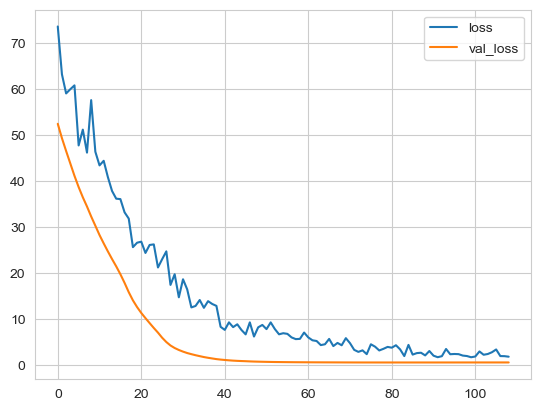

In [260]:
# Plot training loss and validation loss
ANN_loss = pd.DataFrame(history.history)
ANN_loss.plot()

In [261]:
# Define a dictionary to store model results
model_results = {}

# Define a list of models and their predictions (ann_pred_binary, dt_pred, rf_pred, knn_pred, svm_pred, xgb_pred)
models = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'K-Nearest Neighbors', 'SVM', 'XGBoost', 'ANN']
predictions = [pred_log, pred_dc, pred_rf, pred_knn, svm_pred, xg_pred, ann_pred_binary]

# Loop through models and calculate metrics
for model_name, y_pred in zip(models, predictions):
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True)
    matrix = confusion_matrix(y_test, y_pred)
    
    model_results[model_name] = {
        'Accuracy': accuracy,
        'F1-Score': f1,
        'MSE': mse,
        'R2 Score': r2,
        'Precision_0': report.get('0', {}).get('precision', None),
        'Precision_1': report.get('1', {}).get('precision', None),
        'Recall_0': report.get('0', {}).get('recall', None),
        'Recall_1': report.get('1', {}).get('recall', None),
        'Support_0': report.get('0', {}).get('support', None),
        'Support_1': report.get('1', {}).get('support', None),
        'Confusion Matrix': matrix
    }

# Create a DataFrame from the results dictionary
results_df = pd.DataFrame.from_dict(model_results, orient='index')

# Display the results in a table
print(results_df)

                     Accuracy  F1-Score       MSE  R2 Score  Precision_0  \
Logistic Regression  0.767717  0.593103  0.232283 -0.031454     0.775510   
Decision Tree        0.708661  0.588889  0.291339 -0.293688     0.788820   
Random Forest        0.751969  0.603774  0.248031 -0.101383     0.785714   
K-Nearest Neighbors  0.677165  0.523256  0.322835 -0.433547     0.751479   
SVM                  0.767717  0.562963  0.232283 -0.031454     0.762136   
XGBoost              0.720472  0.579882  0.279528 -0.241242     0.779070   
ANN                  0.677165  0.145833  0.322835 -0.433547     0.673469   

                     Precision_1  Recall_0  Recall_1  Support_0  Support_1  \
Logistic Regression     0.741379  0.910180  0.494253        167         87   
Decision Tree           0.569892  0.760479  0.609195        167         87   
Random Forest           0.666667  0.856287  0.551724        167         87   
K-Nearest Neighbors     0.529412  0.760479  0.517241        167         87   
S

### Conclusion:
Based on the evaluation metrics for various machine learning models applied to the diabetes-related dataset, several observations can be made:

#### Logistic Regression and SVM achieved the highest accuracy (approximately 76.77%), although their F1-scores and precision for class 1 were relatively lower compared to other models.
#### Decision Tree and Random Forest models performed reasonably well, achieving accuracy scores of approximately 70.87% and 75.20%, respectively.
#### K-Nearest Neighbors exhibited the lowest accuracy among the models, with an accuracy score of approximately 67.72%.
#### The artificial neural network (ANN) model had the lowest F1-score and precision for class 1, indicating room for improvement in its performance.